In [31]:
import os
import sys
import numpy as np
import pandas as pd
import warnings
import plotly.express as px
import plotly.graph_objects as go
from tqdm import tqdm
tqdm.pandas()

import matplotlib.pyplot as plt
%matplotlib inline

warnings.filterwarnings("ignore") # warningを無視
pd.set_option('display.max_columns', 300)
pd.set_option('display.max_rows', 300)
pd.set_option('display.max_colwidth', 5000)
pd.options.display.float_format = '{:.3f}'.format

sys.path.append('../../../_base_script')
sys.path.append('../../../_utils')

import show_values_from_table as svft
import category_encoder as ce

# 外部モジュールを自動的にリロードする
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [32]:
file_path = '../data/features/'

In [33]:
os.listdir(file_path)

['lgb_0602_2318_submission.csv',
 'y_train.pkl',
 '.DS_Store',
 'X_test.pkl',
 'spectrum_peak_fwhm_df.pkl',
 'X_train.pkl',
 'pseudo_labeling_camaro031_takapy_lgb_0601_2333.pkl',
 '202006006BK',
 '20200602BK',
 'pseudo_labeling_048_066.pkl',
 'wave_umap_tsne_10-5d.pkl',
 '20200605BK',
 '048_066.csv',
 'wave_umap_tsne.pkl',
 'camaro_spectrum.pkl',
 'tsfresh_df.pkl',
 'cavity_df.pkl',
 'lgb_0602_2228_submission.csv',
 'camaro031_takapy_lgb_0601_2333.csv',
 'chip_dic.pkl']

In [41]:
X_train = pd.read_pickle(file_path + 'X_train.pkl')
X_test =  pd.read_pickle(file_path + 'X_test.pkl')
y_train = pd.read_pickle(file_path + 'y_train.pkl')

In [42]:
display(
    X_train.head(), X_train.shape,
    X_test.head(), X_test.shape,
    y_train.head(), y_train.shape
)

,spectrum_id,spectrum_filename,chip_id,exc_wl,layout_a,layout_x,layout_y,pos_x,params0,params1,params2,params3,params4,params5,params6,rms,beta,intensity_max,intensity_min,intensity_mean,intensity_std,intensity_sum,intensity_median,intensity_amplitude_v,intensity_q10,intensity_q25,intensity_q50,intensity_q75,intensity_q80,intensity_q85,intensity_q90,intensity_max_minus_q90,intensity_max_minus_q85,intensity_max_minus_q80,intensity_max_minus_q75,intensity_max_minus_q50,intensity_max_multi_q90,intensity_max_multi_q85,intensity_max_multi_q80,intensity_max_multi_q75,intensity_max_multi_q50,intensity_max_divid_q90,intensity_max_divid_q85,intensity_max_divid_q80,intensity_max_divid_q75,intensity_max_divid_q50,intensity_q85_divid_q90,intensity_q80_divid_q90,intensity_q75_divid_q90,intensity_q50_divid_q90,fwhm_10,num_peak_10,fwhm_098,num_peak_098,fwhm_096,num_peak_096,fwhm_094,num_peak_094,fwhm_092,num_peak_092,fwhm_09,num_peak_09,fwhm_088,num_peak_088,fwhm_086,num_peak_086,fwhm_084,num_peak_084,fwhm_082,num_peak_082,fwhm_08,num_peak_08,fwhm_078,num_peak_078,fwhm_076,num_peak_076,fwhm_074,num_peak_074,fwhm_072,num_peak_072,fwhm_07,num_peak_07,fwhm_068,num_peak_068,fwhm_066,num_peak_066,fwhm_064,num_peak_064,fwhm_062,num_peak_062,fwhm_06,num_peak_06,fwhm_058,num_peak_058,fwhm_056,num_peak_056,fwhm_054,num_peak_054,fwhm_052,num_peak_052,fwhm_05,num_peak_05,fwhm_divid_num_peak_10,fwhm_mult_num_peak_10,fwhm_divid_num_peak_098,fwhm_mult_num_peak_098,fwhm_divid_num_peak_096,fwhm_mult_num_peak_096,fwhm_divid_num_peak_094,fwhm_mult_num_peak_094,fwhm_divid_num_peak_092,fwhm_mult_num_peak_092,fwhm_divid_num_peak_09,fwhm_mult_num_peak_09,fwhm_divid_num_peak_088,fwhm_mult_num_peak_088,fwhm_divid_num_peak_086,fwhm_mult_num_peak_086,fwhm_divid_num_peak_084,fwhm_mult_num_peak_084,fwhm_divid_num_peak_082,fwhm_mult_num_peak_082,fwhm_divid_num_peak_08,fwhm_mult_num_peak_08,fwhm_divid_num_peak_078,fwhm_mult_num_peak_078,fwhm_divid_num_peak_076,fwhm_mult_num_peak_076,fwhm_divid_num_peak_074,fwhm_mult_num_peak_074,fwhm_divid_num_peak_072,fwhm_mult_num_peak_072,fwhm_divid_num_peak_07,fwhm_mult_num_peak_07,fwhm_divid_num_peak_068,fwhm_mult_num_peak_068,fwhm_divid_num_peak_066,fwhm_mult_num_peak_066,fwhm_divid_num_peak_064,fwhm_mult_num_peak_064,fwhm_divid_num_peak_062,fwhm_mult_num_peak_062,fwhm_divid_num_peak_06,fwhm_mult_num_peak_06,fwhm_divid_num_peak_058,fwhm_mult_num_peak_058,fwhm_divid_num_peak_056,fwhm_mult_num_peak_056,fwhm_divid_num_peak_054,fwhm_mult_num_peak_054,...,layout_type_mean_intensity_max,layout_type_mean_intensity_min,layout_type_mean_intensity_q90,layout_type_mean_intensity_q75,"layout_type_mean_intensity__change_quantiles__f_agg_""var""__isabs_True__qh_1.0__ql_0.8",layout_type_mean_intensity__ar_coefficient__coeff_2__k_10,"layout_type_mean_intensity__fft_coefficient__attr_""abs""__coeff_65","layout_type_mean_intensity__fft_coefficient__attr_""abs""__coeff_72",layout_type_mean_params2_multi_params5,layout_type_mean_fwhm_mult_num_peak_086,layout_type_mean_intensity_max_divid_q80,layout_type_mean_dc_umap2,layout_type_mean_fwhm_mult_num_peak_088,layout_type_mean_params3_divid_params1,"layout_type_mean_intensity__change_quantiles__f_agg_""var""__isabs_True__qh_1.0__ql_0.6",layout_type_mean_params5_multi_params2,layout_type_mean_dc_tsne2,layout_type_mean_fwhm_mult_num_peak_084,layout_type_mean_fwhm_10,layout_type_mean_num_peak_10,layout_type_mean_fwhm_098,layout_type_mean_num_peak_098,layout_type_mean_fwhm_096,layout_type_mean_num_peak_096,layout_type_mean_fwhm_094,layout_type_mean_num_peak_094,layout_type_mean_fwhm_092,layout_type_mean_num_peak_092,layout_type_mean_fwhm_09,layout_type_mean_num_peak_09,layout_type_mean_fwhm_088,layout_type_mean_num_peak_088,layout_type_mean_fwhm_086,layout_type_mean_num_peak_086,layout_type_mean_fwhm_084,layout_type_mean_num_peak_084,layout_type_mean_fwhm_082,layout_type_mean_num_peak_082,layout_type_mean_fwhm_08,layout_type_mean_num_peak_08,layout_type_mean_fwhm_078,layout_type_mean_num_peak_078,layout_type_

(7436, 1397)

,spectrum_id,spectrum_filename,chip_id,exc_wl,layout_a,layout_x,layout_y,pos_x,params0,params1,params2,params3,params4,params5,params6,rms,beta,intensity_max,intensity_min,intensity_mean,intensity_std,intensity_sum,intensity_median,intensity_amplitude_v,intensity_q10,intensity_q25,intensity_q50,intensity_q75,intensity_q80,intensity_q85,intensity_q90,intensity_max_minus_q90,intensity_max_minus_q85,intensity_max_minus_q80,intensity_max_minus_q75,intensity_max_minus_q50,intensity_max_multi_q90,intensity_max_multi_q85,intensity_max_multi_q80,intensity_max_multi_q75,intensity_max_multi_q50,intensity_max_divid_q90,intensity_max_divid_q85,intensity_max_divid_q80,intensity_max_divid_q75,intensity_max_divid_q50,intensity_q85_divid_q90,intensity_q80_divid_q90,intensity_q75_divid_q90,intensity_q50_divid_q90,fwhm_10,num_peak_10,fwhm_098,num_peak_098,fwhm_096,num_peak_096,fwhm_094,num_peak_094,fwhm_092,num_peak_092,fwhm_09,num_peak_09,fwhm_088,num_peak_088,fwhm_086,num_peak_086,fwhm_084,num_peak_084,fwhm_082,num_peak_082,fwhm_08,num_peak_08,fwhm_078,num_peak_078,fwhm_076,num_peak_076,fwhm_074,num_peak_074,fwhm_072,num_peak_072,fwhm_07,num_peak_07,fwhm_068,num_peak_068,fwhm_066,num_peak_066,fwhm_064,num_peak_064,fwhm_062,num_peak_062,fwhm_06,num_peak_06,fwhm_058,num_peak_058,fwhm_056,num_peak_056,fwhm_054,num_peak_054,fwhm_052,num_peak_052,fwhm_05,num_peak_05,fwhm_divid_num_peak_10,fwhm_mult_num_peak_10,fwhm_divid_num_peak_098,fwhm_mult_num_peak_098,fwhm_divid_num_peak_096,fwhm_mult_num_peak_096,fwhm_divid_num_peak_094,fwhm_mult_num_peak_094,fwhm_divid_num_peak_092,fwhm_mult_num_peak_092,fwhm_divid_num_peak_09,fwhm_mult_num_peak_09,fwhm_divid_num_peak_088,fwhm_mult_num_peak_088,fwhm_divid_num_peak_086,fwhm_mult_num_peak_086,fwhm_divid_num_peak_084,fwhm_mult_num_peak_084,fwhm_divid_num_peak_082,fwhm_mult_num_peak_082,fwhm_divid_num_peak_08,fwhm_mult_num_peak_08,fwhm_divid_num_peak_078,fwhm_mult_num_peak_078,fwhm_divid_num_peak_076,fwhm_mult_num_peak_076,fwhm_divid_num_peak_074,fwhm_mult_num_peak_074,fwhm_divid_num_peak_072,fwhm_mult_num_peak_072,fwhm_divid_num_peak_07,fwhm_mult_num_peak_07,fwhm_divid_num_peak_068,fwhm_mult_num_peak_068,fwhm_divid_num_peak_066,fwhm_mult_num_peak_066,fwhm_divid_num_peak_064,fwhm_mult_num_peak_064,fwhm_divid_num_peak_062,fwhm_mult_num_peak_062,fwhm_divid_num_peak_06,fwhm_mult_num_peak_06,fwhm_divid_num_peak_058,fwhm_mult_num_peak_058,fwhm_divid_num_peak_056,fwhm_mult_num_peak_056,fwhm_divid_num_peak_054,fwhm_mult_num_peak_054,...,layout_type_mean_intensity_max,layout_type_mean_intensity_min,layout_type_mean_intensity_q90,layout_type_mean_intensity_q75,"layout_type_mean_intensity__change_quantiles__f_agg_""var""__isabs_True__qh_1.0__ql_0.8",layout_type_mean_intensity__ar_coefficient__coeff_2__k_10,"layout_type_mean_intensity__fft_coefficient__attr_""abs""__coeff_65","layout_type_mean_intensity__fft_coefficient__attr_""abs""__coeff_72",layout_type_mean_params2_multi_params5,layout_type_mean_fwhm_mult_num_peak_086,layout_type_mean_intensity_max_divid_q80,layout_type_mean_dc_umap2,layout_type_mean_fwhm_mult_num_peak_088,layout_type_mean_params3_divid_params1,"layout_type_mean_intensity__change_quantiles__f_agg_""var""__isabs_True__qh_1.0__ql_0.6",layout_type_mean_params5_multi_params2,layout_type_mean_dc_tsne2,layout_type_mean_fwhm_mult_num_peak_084,layout_type_mean_fwhm_10,layout_type_mean_num_peak_10,layout_type_mean_fwhm_098,layout_type_mean_num_peak_098,layout_type_mean_fwhm_096,layout_type_mean_num_peak_096,layout_type_mean_fwhm_094,layout_type_mean_num_peak_094,layout_type_mean_fwhm_092,layout_type_mean_num_peak_092,layout_type_mean_fwhm_09,layout_type_mean_num_peak_09,layout_type_mean_fwhm_088,layout_type_mean_num_peak_088,layout_type_mean_fwhm_086,layout_type_mean_num_peak_086,layout_type_mean_fwhm_084,layout_type_mean_num_peak_084,layout_type_mean_fwhm_082,layout_type_mean_num_peak_082,layout_type_mean_fwhm_08,layout_type_mean_num_peak_08,layout_type_mean_fwhm_078,layout_type_mean_num_peak_078,layout_type_

(6952, 1397)

,target
0,0
1,0
2,0
3,0
4,0


(7436, 1)

In [43]:
X_train.groupby(['chip_exc_wl', 'chip_exc_wl_label'])[['chip_exc_wl', 'chip_exc_wl_label']].size().reset_index().sort_values('chip_exc_wl_label')

,chip_exc_wl,chip_exc_wl_label,0
7,79ad4647da6de6425abf_850,0,913
6,79ad4647da6de6425abf_780,1,908
9,c695a1e61e002b34e556_780,2,460
4,6718e7f83c824b1e436d_780,3,579
0,0b9dbf13f938efd5717f_780,4,387
8,84b788fdc5e779f8a0df_850,5,1194
2,118c70535bd753a86615_780,6,826
3,118c70535bd753a86615_850,7,979
1,0b9dbf13f938efd5717f_850,8,621
5,6718e7f83c824b1e436d_850,9,569


In [44]:
col = [col for col in X_train.columns if col.startswith('diff_')]
# for i in X_train.columns.tolist():
for i in col:
    print(i)

diff_chip_id_mean_params0
diff_chip_id_mean_params1
diff_chip_id_mean_params2
diff_chip_id_mean_params3
diff_chip_id_mean_params4
diff_chip_id_mean_params5
diff_chip_id_mean_params6
diff_chip_id_mean_rms
diff_chip_id_mean_beta
diff_chip_id_mean_intensity_amplitude_v
diff_chip_id_mean_intensity_max
diff_chip_id_mean_intensity_min
diff_chip_id_mean_intensity_q90
diff_chip_id_mean_intensity_q75
diff_chip_id_mean_intensity__change_quantiles__f_agg_"var"__isabs_True__qh_1.0__ql_0.8
diff_chip_id_mean_intensity__ar_coefficient__coeff_2__k_10
diff_chip_id_mean_intensity__fft_coefficient__attr_"abs"__coeff_65
diff_chip_id_mean_intensity__fft_coefficient__attr_"abs"__coeff_72
diff_chip_id_mean_params2_multi_params5
diff_chip_id_mean_fwhm_mult_num_peak_086
diff_chip_id_mean_intensity_max_divid_q80
diff_chip_id_mean_dc_umap2
diff_chip_id_mean_fwhm_mult_num_peak_088
diff_chip_id_mean_params3_divid_params1
diff_chip_id_mean_intensity__change_quantiles__f_agg_"var"__isabs_True__qh_1.0__ql_0.6
diff_ch

In [8]:
X_train['label'] = 0
X_test['label'] = 1
df = pd.concat([X_train, X_test], axis=0)

In [9]:
display(
    df.head(), df.shape,
    y_train.head(), y_train.shape
)

,spectrum_id,spectrum_filename,chip_id,exc_wl,layout_a,layout_x,layout_y,pos_x,params0,params1,params2,params3,params4,params5,params6,rms,beta,intensity_max,intensity_min,intensity_mean,intensity_std,intensity_sum,intensity_median,intensity_amplitude_v,intensity_q10,intensity_q25,intensity_q50,intensity_q75,intensity_q80,intensity_q85,intensity_q90,intensity_max_minus_q90,intensity_max_minus_q85,intensity_max_minus_q80,intensity_max_minus_q75,intensity_max_minus_q50,intensity_max_multi_q90,intensity_max_multi_q85,intensity_max_multi_q80,intensity_max_multi_q75,intensity_max_multi_q50,intensity_max_divid_q90,intensity_max_divid_q85,intensity_max_divid_q80,intensity_max_divid_q75,intensity_max_divid_q50,intensity_q85_divid_q90,intensity_q80_divid_q90,intensity_q75_divid_q90,intensity_q50_divid_q90,fwhm_10,num_peak_10,fwhm_098,num_peak_098,fwhm_096,num_peak_096,fwhm_094,num_peak_094,fwhm_092,num_peak_092,fwhm_09,num_peak_09,fwhm_088,num_peak_088,fwhm_086,num_peak_086,fwhm_084,num_peak_084,fwhm_082,num_peak_082,fwhm_08,num_peak_08,fwhm_078,num_peak_078,fwhm_076,num_peak_076,fwhm_074,num_peak_074,fwhm_072,num_peak_072,fwhm_07,num_peak_07,fwhm_068,num_peak_068,fwhm_066,num_peak_066,fwhm_064,num_peak_064,fwhm_062,num_peak_062,fwhm_06,num_peak_06,fwhm_058,num_peak_058,fwhm_056,num_peak_056,fwhm_054,num_peak_054,fwhm_052,num_peak_052,fwhm_05,num_peak_05,fwhm_divid_num_peak_10,fwhm_mult_num_peak_10,fwhm_divid_num_peak_098,fwhm_mult_num_peak_098,fwhm_divid_num_peak_096,fwhm_mult_num_peak_096,fwhm_divid_num_peak_094,fwhm_mult_num_peak_094,fwhm_divid_num_peak_092,fwhm_mult_num_peak_092,fwhm_divid_num_peak_09,fwhm_mult_num_peak_09,fwhm_divid_num_peak_088,fwhm_mult_num_peak_088,fwhm_divid_num_peak_086,fwhm_mult_num_peak_086,fwhm_divid_num_peak_084,fwhm_mult_num_peak_084,fwhm_divid_num_peak_082,fwhm_mult_num_peak_082,fwhm_divid_num_peak_08,fwhm_mult_num_peak_08,fwhm_divid_num_peak_078,fwhm_mult_num_peak_078,fwhm_divid_num_peak_076,fwhm_mult_num_peak_076,fwhm_divid_num_peak_074,fwhm_mult_num_peak_074,fwhm_divid_num_peak_072,fwhm_mult_num_peak_072,fwhm_divid_num_peak_07,fwhm_mult_num_peak_07,fwhm_divid_num_peak_068,fwhm_mult_num_peak_068,fwhm_divid_num_peak_066,fwhm_mult_num_peak_066,fwhm_divid_num_peak_064,fwhm_mult_num_peak_064,fwhm_divid_num_peak_062,fwhm_mult_num_peak_062,fwhm_divid_num_peak_06,fwhm_mult_num_peak_06,fwhm_divid_num_peak_058,fwhm_mult_num_peak_058,fwhm_divid_num_peak_056,fwhm_mult_num_peak_056,fwhm_divid_num_peak_054,fwhm_mult_num_peak_054,...,"intensity__fft_coefficient__attr_""abs""__coeff_23","intensity__cwt_coefficients__coeff_5__w_5__widths_(2, 5, 10, 20)","intensity__cwt_coefficients__coeff_4__w_5__widths_(2, 5, 10, 20)","intensity__cwt_coefficients__coeff_6__w_5__widths_(2, 5, 10, 20)",intensity__sum_of_reoccurring_data_points,intensity__partial_autocorrelation__lag_1,intensity__autocorrelation__lag_1,intensity__ar_coefficient__coeff_8__k_10,"intensity__fft_coefficient__attr_""imag""__coeff_7","intensity__cwt_coefficients__coeff_3__w_5__widths_(2, 5, 10, 20)",intensity__sum_of_reoccurring_values,"intensity__fft_coefficient__attr_""abs""__coeff_20","intensity__fft_coefficient__attr_""abs""__coeff_19",intensity__ar_coefficient__coeff_4__k_10,intensity__cid_ce__normalize_True,"intensity__fft_coefficient__attr_""abs""__coeff_21","intensity__cwt_coefficients__coeff_7__w_5__widths_(2, 5, 10, 20)",intensity__energy_ratio_by_chunks__num_segments_10__segment_focus_4,intensity__friedrich_coefficients__coeff_3__m_3__r_30,intensity__ar_coefficient__coeff_10__k_10,intensity__index_mass_quantile__q_0.7,intensity__minimum,intensity__large_standard_deviation__r_0.15000000000000002,intensity__quantile__q_0.1,intensity__quantile__q_0.2,"intensity__fft_coefficient__attr_""real""__coeff_9","intensity__cwt_coefficients__coeff_7__w_10__widths_(2, 5, 10, 20)","intensity__cwt_coefficients__coeff_8__w_10__widths_(2, 5, 10, 20)","intensity__cwt_coefficients__coeff_2__w_5__widths_(2, 5, 10, 20)",intensity__quantile__q_0.3,"intensity__cwt_coeffi

(14388, 1204)

,target
0,0
1,0
2,0
3,0
4,0


(7436, 1)

## x, yごとに区画を区切る

In [11]:
df.groupby('layout_a')[['layout_x', 'layout_y']].agg(['min', 'max'])

layout_x     layout_y     
              min max      min  max
layout_a                           
1               0  47        0  191
2               0  47        0  191
3               0  47        0  191
4               0  47        0  191

In [15]:
_df = df[['layout_a', 'layout_x', 'layout_y']]

In [16]:
_df.head()

,layout_a,layout_x,layout_y
0,1,36,140
1,2,0,168
2,3,34,29
3,1,32,139
4,4,45,85


In [22]:
def get_layout(row):
    x = row.layout_x
    y = row.layout_y
    if (0 <= x <= 24) & (0 <= y <= 96):
        return 1
    elif (25 <= x <= 47) & (0 <= y <= 96):
        return 2
    elif (0 <= x <= 24) & (97 <= y <= 191):
        return 3
    else:
        return 4

In [27]:
_df['layout_xy'] = _df[['layout_x', 'layout_y']].apply(get_layout, axis=1)

In [28]:
_df.head()

,layout_a,layout_x,layout_y,layout_xy1,layout_xy
0,1,36,140,4,4
1,2,0,168,3,3
2,3,34,29,2,2
3,1,32,139,4,4
4,4,45,85,2,2


In [29]:
_df['layout_type'] = _df['layout_a'].astype(str) + '_' + _df['layout_xy'].astype(str)

In [30]:
_df.head(10)

,layout_a,layout_x,layout_y,layout_xy1,layout_xy,layout_type
0,1,36,140,4,4,1_4
1,2,0,168,3,3,2_3
2,3,34,29,2,2,3_2
3,1,32,139,4,4,1_4
4,4,45,85,2,2,4_2
5,2,26,50,2,2,2_2
6,4,47,118,4,4,4_4
7,2,6,118,3,3,2_3
8,1,23,60,1,1,1_1
9,1,22,68,1,1,1_1


## x y 座標

- x, y座標はどのエリアも x:0-47, y:0-191 の範囲


In [10]:
df.groupby('layout_a')[['layout_x', 'layout_y', 'pos_x']].agg(['min', 'max'])

layout_x     layout_y          pos_x         
              min max      min  max       min      max
layout_a                                              
1               0  47        0  191   153.655 1693.647
2               0  47        0  191   152.926 1698.190
3               0  47        0  191 -1704.037 -187.782
4               0  47        0  191 -1704.704 -187.938

In [11]:
# 共振器位置のエリア内の中心からの距離
# 中心は(24, 96)
import math

def get_distance(row):
    x1 = row['layout_x']
    y1 = row['layout_y']
    x2 = 24
    y2 = 96
    d = math.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)
    return d

In [12]:
df.loc[:, 'distance'] = df.apply(get_distance, axis=1)

In [13]:
df[['distance']]

,distance
0,45.607
1,75.895
2,67.742
3,43.738
4,23.707
...,...
14383,28.425
14384,85.376
14385,57.009
14386,21.024


In [14]:
df.loc[:, 'distance_x'] = abs(24 - df['layout_x'])
df.loc[:, 'distance_y'] = abs(96 - df['layout_y'])

In [15]:
df[['distance', 'distance_x', 'distance_y']]

,distance,distance_x,distance_y
0,45.607,12,44
1,75.895,24,72
2,67.742,10,67
3,43.738,8,43
4,23.707,21,11
...,...,...,...
14383,28.425,22,18
14384,85.376,8,85
14385,57.009,1,57
14386,21.024,21,1


In [16]:
df.head()

,spectrum_id,spectrum_filename,chip_id,exc_wl,layout_a,layout_x,layout_y,pos_x,params0,params1,params2,params3,params4,params5,params6,rms,beta,intensity_max,intensity_min,intensity_mean,intensity_std,intensity_sum,intensity_median,intensity_amplitude_v,intensity_q10,intensity_q25,intensity_q50,intensity_q75,intensity_q80,intensity_q85,intensity_q90,intensity_max_minus_q90,intensity_max_minus_q85,intensity_max_minus_q80,intensity_max_minus_q75,intensity_max_minus_q50,intensity_max_multi_q90,intensity_max_multi_q85,intensity_max_multi_q80,intensity_max_multi_q75,intensity_max_multi_q50,intensity_max_divid_q90,intensity_max_divid_q85,intensity_max_divid_q80,intensity_max_divid_q75,intensity_max_divid_q50,intensity_q85_divid_q90,intensity_q80_divid_q90,intensity_q75_divid_q90,intensity_q50_divid_q90,fwhm_10,num_peak_10,fwhm_098,num_peak_098,fwhm_096,num_peak_096,fwhm_094,num_peak_094,fwhm_092,num_peak_092,fwhm_09,num_peak_09,fwhm_088,num_peak_088,fwhm_086,num_peak_086,fwhm_084,num_peak_084,fwhm_082,num_peak_082,fwhm_08,num_peak_08,fwhm_078,num_peak_078,fwhm_076,num_peak_076,fwhm_074,num_peak_074,fwhm_072,num_peak_072,fwhm_07,num_peak_07,fwhm_068,num_peak_068,fwhm_066,num_peak_066,fwhm_064,num_peak_064,fwhm_062,num_peak_062,fwhm_06,num_peak_06,fwhm_058,num_peak_058,fwhm_056,num_peak_056,fwhm_054,num_peak_054,fwhm_052,num_peak_052,fwhm_05,num_peak_05,fwhm_divid_num_peak_10,fwhm_mult_num_peak_10,fwhm_divid_num_peak_098,fwhm_mult_num_peak_098,fwhm_divid_num_peak_096,fwhm_mult_num_peak_096,fwhm_divid_num_peak_094,fwhm_mult_num_peak_094,fwhm_divid_num_peak_092,fwhm_mult_num_peak_092,fwhm_divid_num_peak_09,fwhm_mult_num_peak_09,fwhm_divid_num_peak_088,fwhm_mult_num_peak_088,fwhm_divid_num_peak_086,fwhm_mult_num_peak_086,fwhm_divid_num_peak_084,fwhm_mult_num_peak_084,fwhm_divid_num_peak_082,fwhm_mult_num_peak_082,fwhm_divid_num_peak_08,fwhm_mult_num_peak_08,fwhm_divid_num_peak_078,fwhm_mult_num_peak_078,fwhm_divid_num_peak_076,fwhm_mult_num_peak_076,fwhm_divid_num_peak_074,fwhm_mult_num_peak_074,fwhm_divid_num_peak_072,fwhm_mult_num_peak_072,fwhm_divid_num_peak_07,fwhm_mult_num_peak_07,fwhm_divid_num_peak_068,fwhm_mult_num_peak_068,fwhm_divid_num_peak_066,fwhm_mult_num_peak_066,fwhm_divid_num_peak_064,fwhm_mult_num_peak_064,fwhm_divid_num_peak_062,fwhm_mult_num_peak_062,fwhm_divid_num_peak_06,fwhm_mult_num_peak_06,fwhm_divid_num_peak_058,fwhm_mult_num_peak_058,fwhm_divid_num_peak_056,fwhm_mult_num_peak_056,fwhm_divid_num_peak_054,fwhm_mult_num_peak_054,...,"intensity__fft_coefficient__attr_""abs""__coeff_23","intensity__cwt_coefficients__coeff_5__w_5__widths_(2, 5, 10, 20)","intensity__cwt_coefficients__coeff_4__w_5__widths_(2, 5, 10, 20)","intensity__cwt_coefficients__coeff_6__w_5__widths_(2, 5, 10, 20)",intensity__sum_of_reoccurring_data_points,intensity__partial_autocorrelation__lag_1,intensity__autocorrelation__lag_1,intensity__ar_coefficient__coeff_8__k_10,"intensity__fft_coefficient__attr_""imag""__coeff_7","intensity__cwt_coefficients__coeff_3__w_5__widths_(2, 5, 10, 20)",intensity__sum_of_reoccurring_values,"intensity__fft_coefficient__attr_""abs""__coeff_20","intensity__fft_coefficient__attr_""abs""__coeff_19",intensity__ar_coefficient__coeff_4__k_10,intensity__cid_ce__normalize_True,"intensity__fft_coefficient__attr_""abs""__coeff_21","intensity__cwt_coefficients__coeff_7__w_5__widths_(2, 5, 10, 20)",intensity__energy_ratio_by_chunks__num_segments_10__segment_focus_4,intensity__friedrich_coefficients__coeff_3__m_3__r_30,intensity__ar_coefficient__coeff_10__k_10,intensity__index_mass_quantile__q_0.7,intensity__minimum,intensity__large_standard_deviation__r_0.15000000000000002,intensity__quantile__q_0.1,intensity__quantile__q_0.2,"intensity__fft_coefficient__attr_""real""__coeff_9","intensity__cwt_coefficients__coeff_7__w_10__widths_(2, 5, 10, 20)","intensity__cwt_coefficients__coeff_8__w_10__widths_(2, 5, 10, 20)","intensity__cwt_coefficients__coeff_2__w_5__widths_(2, 5, 10, 20)",intensity__quantile__q_0.3,"intensity__cwt_coeffi

# EDA

## 欠損データ

- train/test共になし

In [68]:
svft.missing_values(X_train)

,spectrum_id,spectrum_filename,chip_id,exc_wl,layout_a,layout_x,layout_y,pos_x,params0,params1,params2,params3,params4,params5,params6,rms,beta,index,intensity_max,intensity_min,intensity_mean,intensity_std,intensity_sum,intensity_median,intensity_amplitude_v,intensity_max_log1p,intensity_mean_log1p,intensity_std_log1p,intensity_sum_log1p,intensity_median_log1p,intensity_amplitude_v_log1p,intensity_q10,intensity_q25,intensity_q50,intensity_q75,intensity_q90,intensity_max_minus_q90,intensity_max_minus_q75,intensity_max_minus_q50,intensity_max_multi_q90,intensity_max_multi_q75,intensity_max_multi_q50,intensity_max_divid_q90,intensity_max_divid_q75,intensity_max_divid_q50,fwhm_10,num_peak_10,fwhm_095,num_peak_095,fwhm_09,num_peak_09,fwhm_085,num_peak_085,fwhm_08,num_peak_08,fwhm_075,num_peak_075,fwhm_07,num_peak_07,fwhm_065,num_peak_065,fwhm_06,num_peak_06,fwhm_055,num_peak_055,fwhm_05,num_peak_05,fwhm_045,num_peak_045,fwhm_04,num_peak_04,fwhm_035,num_peak_035,fwhm_03,num_peak_03,fwhm_025,num_peak_025,fwhm_02,num_peak_02,fwhm_015,num_peak_015,fwhm_01,num_peak_01,fwhm_divid_num_peak_10,fwhm_mult_num_peak_10,fwhm_divid_num_peak_095,fwhm_mult_num_peak_095,fwhm_divid_num_peak_09,fwhm_mult_num_peak_09,fwhm_divid_num_peak_085,fwhm_mult_num_peak_085,fwhm_divid_num_peak_08,fwhm_mult_num_peak_08,fwhm_divid_num_peak_075,fwhm_mult_num_peak_075,fwhm_divid_num_peak_07,fwhm_mult_num_peak_07,fwhm_divid_num_peak_065,fwhm_mult_num_peak_065,fwhm_divid_num_peak_06,fwhm_mult_num_peak_06,fwhm_divid_num_peak_055,fwhm_mult_num_peak_055,fwhm_divid_num_peak_05,fwhm_mult_num_peak_05,fwhm_divid_num_peak_045,fwhm_mult_num_peak_045,fwhm_divid_num_peak_04,fwhm_mult_num_peak_04,fwhm_divid_num_peak_035,fwhm_mult_num_peak_035,fwhm_divid_num_peak_03,fwhm_mult_num_peak_03,fwhm_divid_num_peak_025,fwhm_mult_num_peak_025,fwhm_divid_num_peak_02,fwhm_mult_num_peak_02,fwhm_divid_num_peak_015,fwhm_mult_num_peak_015,fwhm_divid_num_peak_01,fwhm_mult_num_peak_01,params0_multi_params1,params0_divid_params1,params0_plus_params1,params0_minus_params1,params0_multi_params2,params0_divid_params2,params0_plus_params2,params0_minus_params2,params0_multi_params3,params0_divid_params3,params0_plus_params3,params0_minus_params3,params0_multi_params4,params0_divid_params4,params0_plus_params4,params0_minus_params4,params0_multi_params5,params0_divid_params5,params0_plus_params5,params0_minus_params5,params0_multi_params6,params0_divid_params6,params0_plus_params6,params0_minus_params6,params1_multi_params0,params1_divid_params0,params1_plus_params0,params1_minus_params0,params1_multi_params2,params1_divid_params2,params1_plus_params2,params1_minus_params2,params1_multi_params3,params1_divid_params3,params1_plus_params3,params1_minus_params3,params1_multi_params4,params1_divid_params4,params1_plus_params4,params1_minus_params4,params1_multi_params5,params1_divid_params5,params1_plus_params5,params1_minus_params5,params1_multi_params6,params1_divid_params6,params1_plus_params6,params1_minus_params6,params2_multi_params0,params2_divid_params0,params2_plus_params0,params2_minus_params0,params2_multi_params1,params2_divid_params1,params2_plus_params1,params2_minus_params1,params2_multi_params3,params2_divid_params3,params2_plus_params3,params2_minus_params3,params2_multi_params4,params2_divid_params4,params2_plus_params4,params2_minus_params4,params2_multi_params5,params2_divid_params5,params2_plus_params5,params2_minus_params5,params2_multi_params6,params2_divid_params6,params2_plus_params6,params2_minus_params6,params3_multi_params0,params3_divid_params0,params3_plus_params0,params3_minus_params0,params3_multi_params1,params3_divid_params1,params3_plus_params1,params3_minus_params1,params3_multi_params2,params3_divid_params2,params3_plus_params2,params3_minus_params2,params3_multi_params4,params3_divid_params4,params3_plus_params4,params3_minus_params4,params3_multi_params5,params3_divid_params5,params3_plus_params5,params3_minus_params5,params3_multi_params6,params3_divid_params6,params

In [69]:
svft.missing_values(X_test)

,spectrum_id,spectrum_filename,chip_id,exc_wl,layout_a,layout_x,layout_y,pos_x,params0,params1,params2,params3,params4,params5,params6,rms,beta,index,intensity_max,intensity_min,intensity_mean,intensity_std,intensity_sum,intensity_median,intensity_amplitude_v,intensity_max_log1p,intensity_mean_log1p,intensity_std_log1p,intensity_sum_log1p,intensity_median_log1p,intensity_amplitude_v_log1p,intensity_q10,intensity_q25,intensity_q50,intensity_q75,intensity_q90,intensity_max_minus_q90,intensity_max_minus_q75,intensity_max_minus_q50,intensity_max_multi_q90,intensity_max_multi_q75,intensity_max_multi_q50,intensity_max_divid_q90,intensity_max_divid_q75,intensity_max_divid_q50,fwhm_10,num_peak_10,fwhm_095,num_peak_095,fwhm_09,num_peak_09,fwhm_085,num_peak_085,fwhm_08,num_peak_08,fwhm_075,num_peak_075,fwhm_07,num_peak_07,fwhm_065,num_peak_065,fwhm_06,num_peak_06,fwhm_055,num_peak_055,fwhm_05,num_peak_05,fwhm_045,num_peak_045,fwhm_04,num_peak_04,fwhm_035,num_peak_035,fwhm_03,num_peak_03,fwhm_025,num_peak_025,fwhm_02,num_peak_02,fwhm_015,num_peak_015,fwhm_01,num_peak_01,fwhm_divid_num_peak_10,fwhm_mult_num_peak_10,fwhm_divid_num_peak_095,fwhm_mult_num_peak_095,fwhm_divid_num_peak_09,fwhm_mult_num_peak_09,fwhm_divid_num_peak_085,fwhm_mult_num_peak_085,fwhm_divid_num_peak_08,fwhm_mult_num_peak_08,fwhm_divid_num_peak_075,fwhm_mult_num_peak_075,fwhm_divid_num_peak_07,fwhm_mult_num_peak_07,fwhm_divid_num_peak_065,fwhm_mult_num_peak_065,fwhm_divid_num_peak_06,fwhm_mult_num_peak_06,fwhm_divid_num_peak_055,fwhm_mult_num_peak_055,fwhm_divid_num_peak_05,fwhm_mult_num_peak_05,fwhm_divid_num_peak_045,fwhm_mult_num_peak_045,fwhm_divid_num_peak_04,fwhm_mult_num_peak_04,fwhm_divid_num_peak_035,fwhm_mult_num_peak_035,fwhm_divid_num_peak_03,fwhm_mult_num_peak_03,fwhm_divid_num_peak_025,fwhm_mult_num_peak_025,fwhm_divid_num_peak_02,fwhm_mult_num_peak_02,fwhm_divid_num_peak_015,fwhm_mult_num_peak_015,fwhm_divid_num_peak_01,fwhm_mult_num_peak_01,params0_multi_params1,params0_divid_params1,params0_plus_params1,params0_minus_params1,params0_multi_params2,params0_divid_params2,params0_plus_params2,params0_minus_params2,params0_multi_params3,params0_divid_params3,params0_plus_params3,params0_minus_params3,params0_multi_params4,params0_divid_params4,params0_plus_params4,params0_minus_params4,params0_multi_params5,params0_divid_params5,params0_plus_params5,params0_minus_params5,params0_multi_params6,params0_divid_params6,params0_plus_params6,params0_minus_params6,params1_multi_params0,params1_divid_params0,params1_plus_params0,params1_minus_params0,params1_multi_params2,params1_divid_params2,params1_plus_params2,params1_minus_params2,params1_multi_params3,params1_divid_params3,params1_plus_params3,params1_minus_params3,params1_multi_params4,params1_divid_params4,params1_plus_params4,params1_minus_params4,params1_multi_params5,params1_divid_params5,params1_plus_params5,params1_minus_params5,params1_multi_params6,params1_divid_params6,params1_plus_params6,params1_minus_params6,params2_multi_params0,params2_divid_params0,params2_plus_params0,params2_minus_params0,params2_multi_params1,params2_divid_params1,params2_plus_params1,params2_minus_params1,params2_multi_params3,params2_divid_params3,params2_plus_params3,params2_minus_params3,params2_multi_params4,params2_divid_params4,params2_plus_params4,params2_minus_params4,params2_multi_params5,params2_divid_params5,params2_plus_params5,params2_minus_params5,params2_multi_params6,params2_divid_params6,params2_plus_params6,params2_minus_params6,params3_multi_params0,params3_divid_params0,params3_plus_params0,params3_minus_params0,params3_multi_params1,params3_divid_params1,params3_plus_params1,params3_minus_params1,params3_multi_params2,params3_divid_params2,params3_plus_params2,params3_minus_params2,params3_multi_params4,params3_divid_params4,params3_plus_params4,params3_minus_params4,params3_multi_params5,params3_divid_params5,params3_plus_params5,params3_minus_params5,params3_multi_params6,params3_divid_params6,params

## ユニークな値

In [70]:
svft.most_frequent_values(X_train)

,spectrum_id,spectrum_filename,chip_id,exc_wl,layout_a,layout_x,layout_y,pos_x,params0,params1,params2,params3,params4,params5,params6,rms,beta,index,intensity_max,intensity_min,intensity_mean,intensity_std,intensity_sum,intensity_median,intensity_amplitude_v,intensity_max_log1p,intensity_mean_log1p,intensity_std_log1p,intensity_sum_log1p,intensity_median_log1p,intensity_amplitude_v_log1p,intensity_q10,intensity_q25,intensity_q50,intensity_q75,intensity_q90,intensity_max_minus_q90,intensity_max_minus_q75,intensity_max_minus_q50,intensity_max_multi_q90,intensity_max_multi_q75,intensity_max_multi_q50,intensity_max_divid_q90,intensity_max_divid_q75,intensity_max_divid_q50,fwhm_10,num_peak_10,fwhm_095,num_peak_095,fwhm_09,num_peak_09,fwhm_085,num_peak_085,fwhm_08,num_peak_08,fwhm_075,num_peak_075,fwhm_07,num_peak_07,fwhm_065,num_peak_065,fwhm_06,num_peak_06,fwhm_055,num_peak_055,fwhm_05,num_peak_05,fwhm_045,num_peak_045,fwhm_04,num_peak_04,fwhm_035,num_peak_035,fwhm_03,num_peak_03,fwhm_025,num_peak_025,fwhm_02,num_peak_02,fwhm_015,num_peak_015,fwhm_01,num_peak_01,fwhm_divid_num_peak_10,fwhm_mult_num_peak_10,fwhm_divid_num_peak_095,fwhm_mult_num_peak_095,fwhm_divid_num_peak_09,fwhm_mult_num_peak_09,fwhm_divid_num_peak_085,fwhm_mult_num_peak_085,fwhm_divid_num_peak_08,fwhm_mult_num_peak_08,fwhm_divid_num_peak_075,fwhm_mult_num_peak_075,fwhm_divid_num_peak_07,fwhm_mult_num_peak_07,fwhm_divid_num_peak_065,fwhm_mult_num_peak_065,fwhm_divid_num_peak_06,fwhm_mult_num_peak_06,fwhm_divid_num_peak_055,fwhm_mult_num_peak_055,fwhm_divid_num_peak_05,fwhm_mult_num_peak_05,fwhm_divid_num_peak_045,fwhm_mult_num_peak_045,fwhm_divid_num_peak_04,fwhm_mult_num_peak_04,fwhm_divid_num_peak_035,fwhm_mult_num_peak_035,fwhm_divid_num_peak_03,fwhm_mult_num_peak_03,fwhm_divid_num_peak_025,fwhm_mult_num_peak_025,fwhm_divid_num_peak_02,fwhm_mult_num_peak_02,fwhm_divid_num_peak_015,fwhm_mult_num_peak_015,fwhm_divid_num_peak_01,fwhm_mult_num_peak_01,params0_multi_params1,params0_divid_params1,params0_plus_params1,params0_minus_params1,params0_multi_params2,params0_divid_params2,params0_plus_params2,params0_minus_params2,params0_multi_params3,params0_divid_params3,params0_plus_params3,params0_minus_params3,params0_multi_params4,params0_divid_params4,params0_plus_params4,params0_minus_params4,params0_multi_params5,params0_divid_params5,params0_plus_params5,params0_minus_params5,params0_multi_params6,params0_divid_params6,params0_plus_params6,params0_minus_params6,params1_multi_params0,params1_divid_params0,params1_plus_params0,params1_minus_params0,params1_multi_params2,params1_divid_params2,params1_plus_params2,params1_minus_params2,params1_multi_params3,params1_divid_params3,params1_plus_params3,params1_minus_params3,params1_multi_params4,params1_divid_params4,params1_plus_params4,params1_minus_params4,params1_multi_params5,params1_divid_params5,params1_plus_params5,params1_minus_params5,params1_multi_params6,params1_divid_params6,params1_plus_params6,params1_minus_params6,params2_multi_params0,params2_divid_params0,params2_plus_params0,params2_minus_params0,params2_multi_params1,params2_divid_params1,params2_plus_params1,params2_minus_params1,params2_multi_params3,params2_divid_params3,params2_plus_params3,params2_minus_params3,params2_multi_params4,params2_divid_params4,params2_plus_params4,params2_minus_params4,params2_multi_params5,params2_divid_params5,params2_plus_params5,params2_minus_params5,params2_multi_params6,params2_divid_params6,params2_plus_params6,params2_minus_params6,params3_multi_params0,params3_divid_params0,params3_plus_params0,params3_minus_params0,params3_multi_params1,params3_divid_params1,params3_plus_params1,params3_minus_params1,params3_multi_params2,params3_divid_params2,params3_plus_params2,params3_minus_params2,params3_multi_params4,params3_divid_params4,params3_plus_params4,params3_minus_params4,params3_multi_params5,params3_divid_params5,params3_plus_params5,params3_minus_params5,params3_multi_params6,params3_divid_params6,params

In [71]:
svft.most_frequent_values(X_test)

,spectrum_id,spectrum_filename,chip_id,exc_wl,layout_a,layout_x,layout_y,pos_x,params0,params1,params2,params3,params4,params5,params6,rms,beta,index,intensity_max,intensity_min,intensity_mean,intensity_std,intensity_sum,intensity_median,intensity_amplitude_v,intensity_max_log1p,intensity_mean_log1p,intensity_std_log1p,intensity_sum_log1p,intensity_median_log1p,intensity_amplitude_v_log1p,intensity_q10,intensity_q25,intensity_q50,intensity_q75,intensity_q90,intensity_max_minus_q90,intensity_max_minus_q75,intensity_max_minus_q50,intensity_max_multi_q90,intensity_max_multi_q75,intensity_max_multi_q50,intensity_max_divid_q90,intensity_max_divid_q75,intensity_max_divid_q50,fwhm_10,num_peak_10,fwhm_095,num_peak_095,fwhm_09,num_peak_09,fwhm_085,num_peak_085,fwhm_08,num_peak_08,fwhm_075,num_peak_075,fwhm_07,num_peak_07,fwhm_065,num_peak_065,fwhm_06,num_peak_06,fwhm_055,num_peak_055,fwhm_05,num_peak_05,fwhm_045,num_peak_045,fwhm_04,num_peak_04,fwhm_035,num_peak_035,fwhm_03,num_peak_03,fwhm_025,num_peak_025,fwhm_02,num_peak_02,fwhm_015,num_peak_015,fwhm_01,num_peak_01,fwhm_divid_num_peak_10,fwhm_mult_num_peak_10,fwhm_divid_num_peak_095,fwhm_mult_num_peak_095,fwhm_divid_num_peak_09,fwhm_mult_num_peak_09,fwhm_divid_num_peak_085,fwhm_mult_num_peak_085,fwhm_divid_num_peak_08,fwhm_mult_num_peak_08,fwhm_divid_num_peak_075,fwhm_mult_num_peak_075,fwhm_divid_num_peak_07,fwhm_mult_num_peak_07,fwhm_divid_num_peak_065,fwhm_mult_num_peak_065,fwhm_divid_num_peak_06,fwhm_mult_num_peak_06,fwhm_divid_num_peak_055,fwhm_mult_num_peak_055,fwhm_divid_num_peak_05,fwhm_mult_num_peak_05,fwhm_divid_num_peak_045,fwhm_mult_num_peak_045,fwhm_divid_num_peak_04,fwhm_mult_num_peak_04,fwhm_divid_num_peak_035,fwhm_mult_num_peak_035,fwhm_divid_num_peak_03,fwhm_mult_num_peak_03,fwhm_divid_num_peak_025,fwhm_mult_num_peak_025,fwhm_divid_num_peak_02,fwhm_mult_num_peak_02,fwhm_divid_num_peak_015,fwhm_mult_num_peak_015,fwhm_divid_num_peak_01,fwhm_mult_num_peak_01,params0_multi_params1,params0_divid_params1,params0_plus_params1,params0_minus_params1,params0_multi_params2,params0_divid_params2,params0_plus_params2,params0_minus_params2,params0_multi_params3,params0_divid_params3,params0_plus_params3,params0_minus_params3,params0_multi_params4,params0_divid_params4,params0_plus_params4,params0_minus_params4,params0_multi_params5,params0_divid_params5,params0_plus_params5,params0_minus_params5,params0_multi_params6,params0_divid_params6,params0_plus_params6,params0_minus_params6,params1_multi_params0,params1_divid_params0,params1_plus_params0,params1_minus_params0,params1_multi_params2,params1_divid_params2,params1_plus_params2,params1_minus_params2,params1_multi_params3,params1_divid_params3,params1_plus_params3,params1_minus_params3,params1_multi_params4,params1_divid_params4,params1_plus_params4,params1_minus_params4,params1_multi_params5,params1_divid_params5,params1_plus_params5,params1_minus_params5,params1_multi_params6,params1_divid_params6,params1_plus_params6,params1_minus_params6,params2_multi_params0,params2_divid_params0,params2_plus_params0,params2_minus_params0,params2_multi_params1,params2_divid_params1,params2_plus_params1,params2_minus_params1,params2_multi_params3,params2_divid_params3,params2_plus_params3,params2_minus_params3,params2_multi_params4,params2_divid_params4,params2_plus_params4,params2_minus_params4,params2_multi_params5,params2_divid_params5,params2_plus_params5,params2_minus_params5,params2_multi_params6,params2_divid_params6,params2_plus_params6,params2_minus_params6,params3_multi_params0,params3_divid_params0,params3_plus_params0,params3_minus_params0,params3_multi_params1,params3_divid_params1,params3_plus_params1,params3_minus_params1,params3_multi_params2,params3_divid_params2,params3_plus_params2,params3_minus_params2,params3_multi_params4,params3_divid_params4,params3_plus_params4,params3_minus_params4,params3_multi_params5,params3_divid_params5,params3_plus_params5,params3_minus_params5,params3_multi_params6,params3_divid_params6,params

# EDA

## 光の強度の統計量

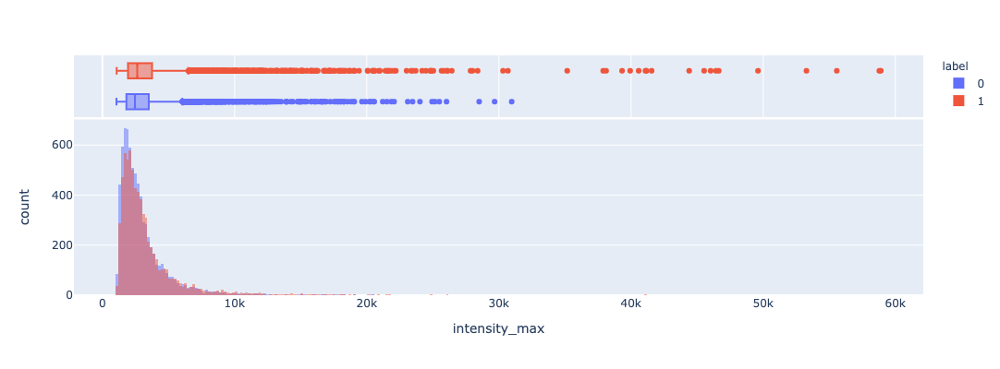

In [57]:
fig = px.histogram(df, x='intensity_max', color='label',
                   width=800, height=400, opacity=0.5, marginal='box')
fig.update_layout(barmode='overlay')
fig.show()

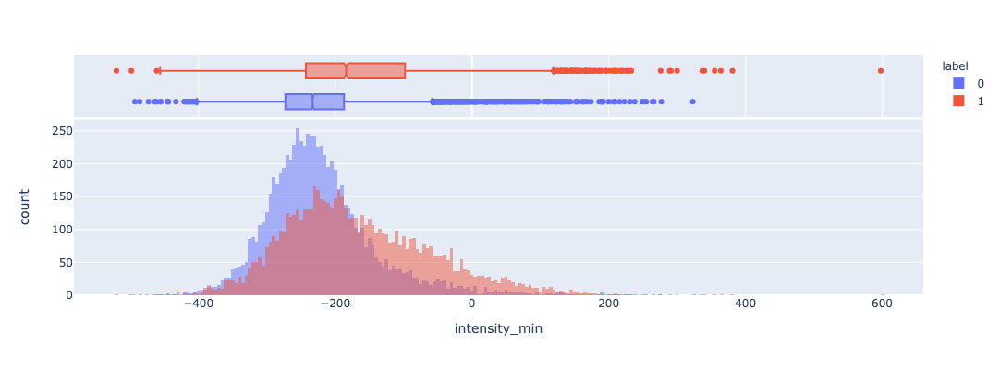

In [58]:
fig = px.histogram(df, x='intensity_min', color='label',
                   width=800, height=400, opacity=0.5, marginal='box')
fig.update_layout(barmode='overlay')
fig.show()

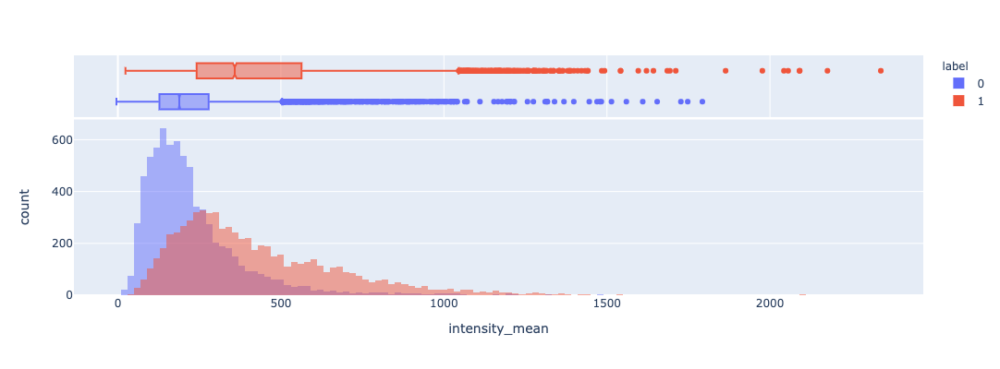

In [59]:
fig = px.histogram(df, x='intensity_mean', color='label',
                   width=800, height=400, opacity=0.5, marginal='box')
fig.update_layout(barmode='overlay')
fig.show()

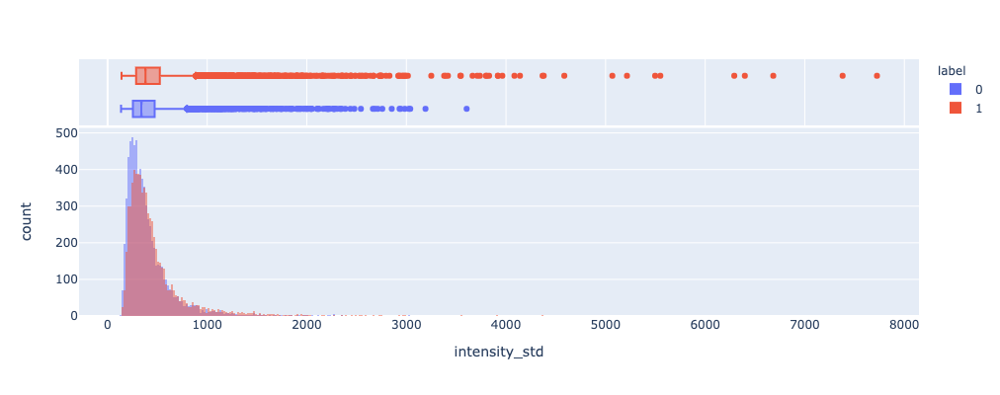

In [60]:
fig = px.histogram(df, x='intensity_std', color='label',
                   width=800, height=400, opacity=0.5, marginal='box')
fig.update_layout(barmode='overlay')
fig.show()

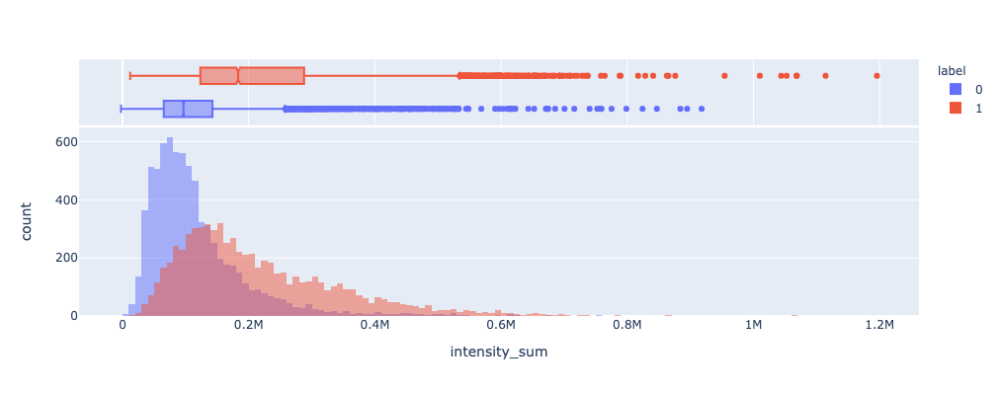

In [61]:
fig = px.histogram(df, x='intensity_sum', color='label',
                   width=800, height=400, opacity=0.5, marginal='box')
fig.update_layout(barmode='overlay')
fig.show()

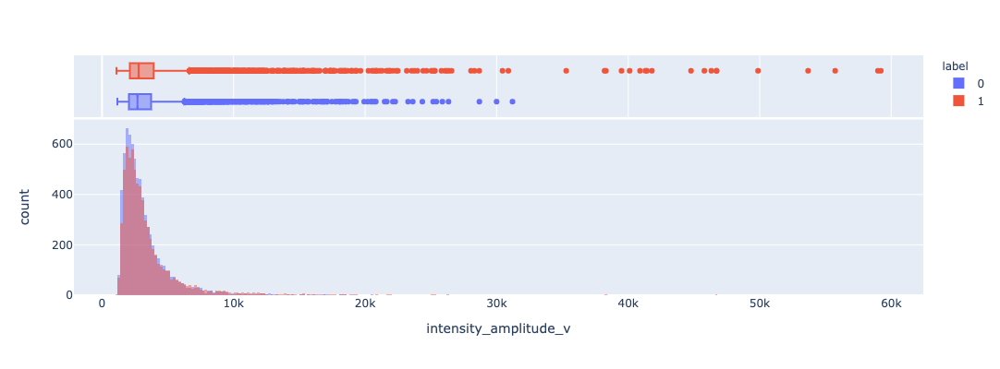

In [62]:
fig = px.histogram(df, x='intensity_amplitude_v', color='label',
                   width=800, height=400, opacity=0.5, marginal='box')
fig.update_layout(barmode='overlay')
fig.show()

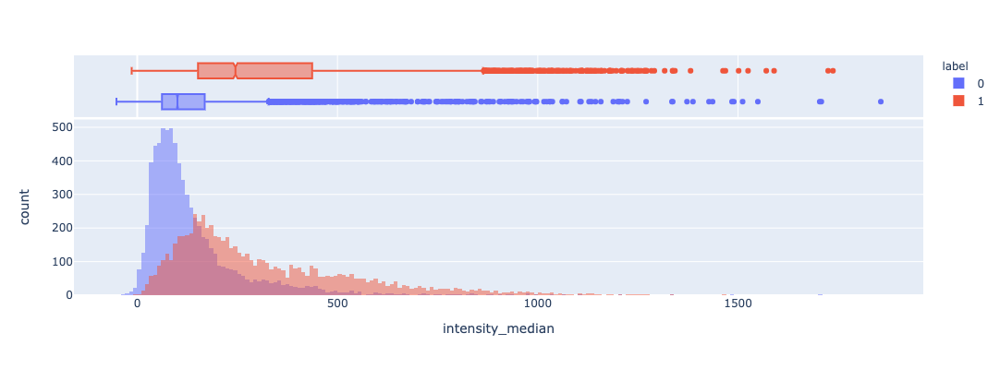

In [63]:
fig = px.histogram(df, x='intensity_median', color='label',
                   width=800, height=400, opacity=0.5, marginal='box')
fig.update_layout(barmode='overlay')
fig.show()

- 対数変換してみる

In [47]:
df['intensity_max_log1p'] = np.log1p(df['intensity_max'])
df['intensity_min_log1p'] = np.log1p(df['intensity_min'])
df['intensity_mean_log1p'] = np.log1p(df['intensity_mean'])
df['intensity_std_log1p'] = np.log1p(df['intensity_std'])
df['intensity_sum_log1p'] = np.log1p(df['intensity_sum'])
df['intensity_amplitude_v_log1p'] = np.log1p(df['intensity_amplitude_v'])

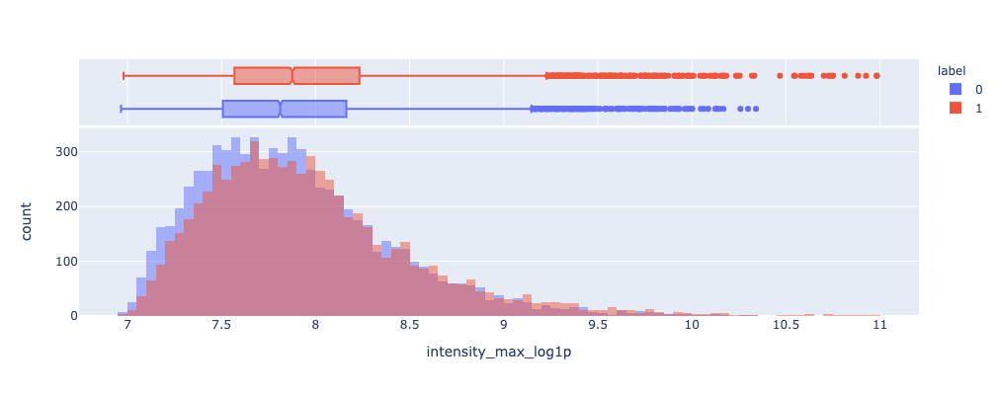

In [42]:
fig = px.histogram(df, x='intensity_max_log1p', color='label',
                   width=800, height=400, opacity=0.5, marginal='box')
fig.update_layout(barmode='overlay')
fig.show()

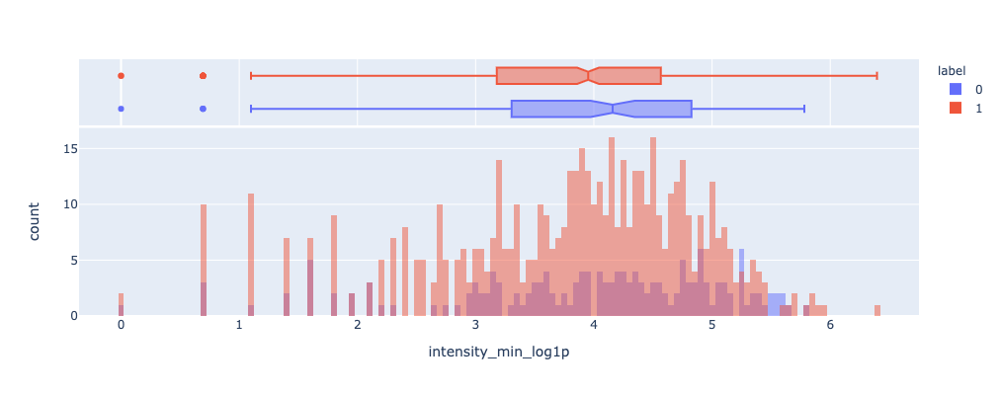

In [43]:
fig = px.histogram(df, x='intensity_min_log1p', color='label',
                   width=800, height=400, opacity=0.5, marginal='box')
fig.update_layout(barmode='overlay')
fig.show()

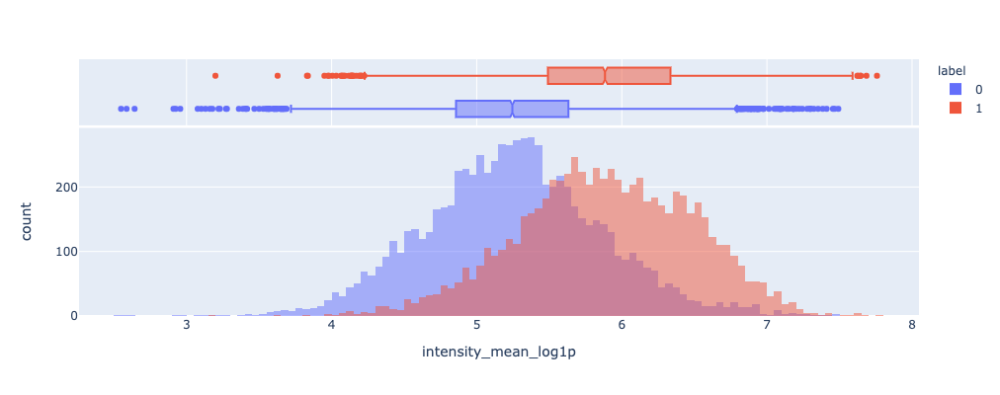

In [44]:
fig = px.histogram(df, x='intensity_mean_log1p', color='label',
                   width=800, height=400, opacity=0.5, marginal='box')
fig.update_layout(barmode='overlay')
fig.show()

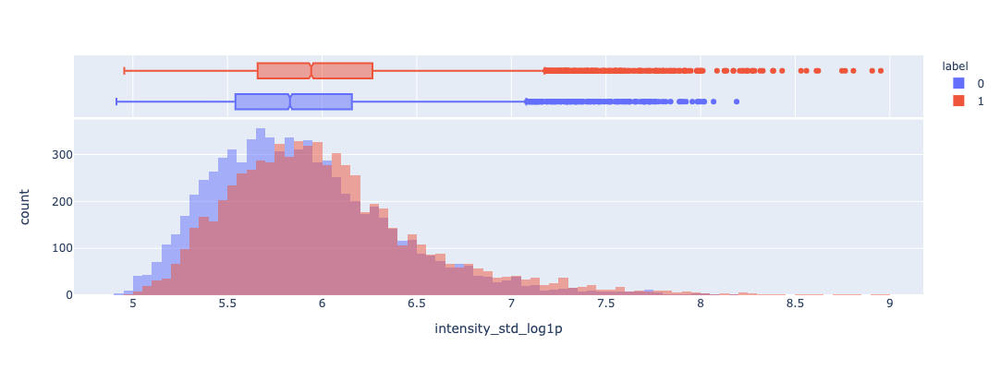

In [45]:
fig = px.histogram(df, x='intensity_std_log1p', color='label',
                   width=800, height=400, opacity=0.5, marginal='box')
fig.update_layout(barmode='overlay')
fig.show()

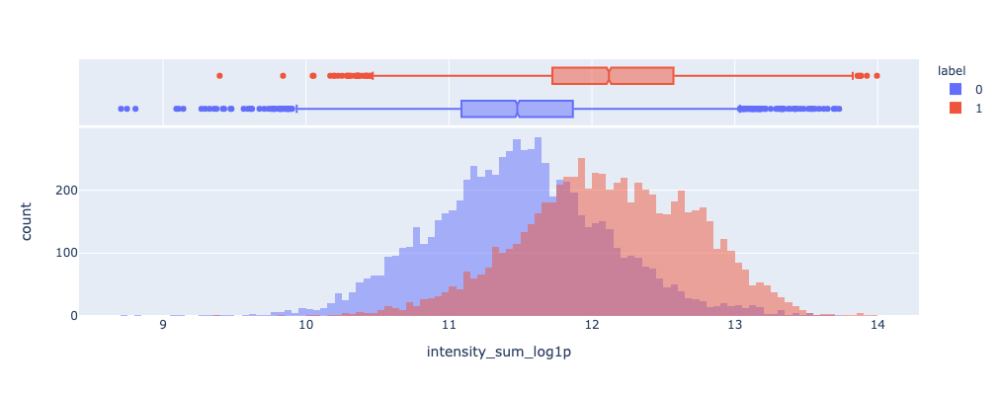

In [46]:
fig = px.histogram(df, x='intensity_sum_log1p', color='label',
                   width=800, height=400, opacity=0.5, marginal='box')
fig.update_layout(barmode='overlay')
fig.show()

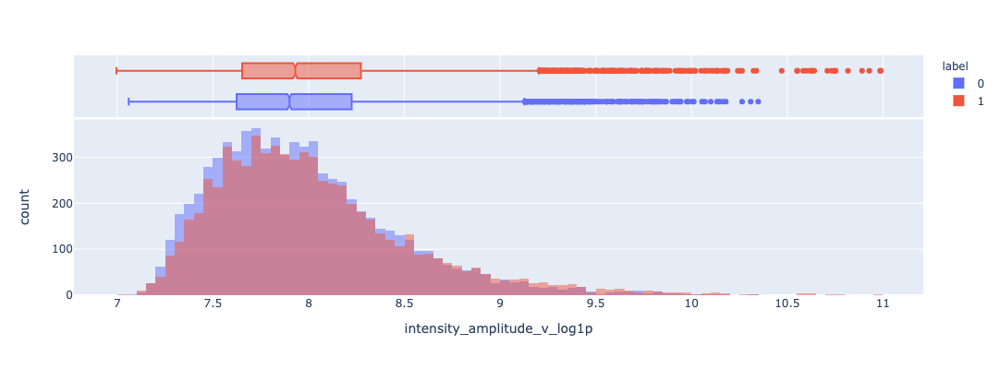

In [48]:
fig = px.histogram(df, x='intensity_amplitude_v_log1p', color='label',
                   width=800, height=400, opacity=0.5, marginal='box')
fig.update_layout(barmode='overlay')
fig.show()

## x y 座標

- x, y座標はどのエリアも x:0-47, y:0-191 の範囲


In [78]:
df.groupby('layout_a')[['layout_x', 'layout_y', 'pos_x']].agg(['min', 'max'])

layout_x     layout_y          pos_x         
              min max      min  max       min      max
layout_a                                              
1               0  47        0  191   153.655 1693.647
2               0  47        0  191   152.926 1698.190
3               0  47        0  191 -1704.037 -187.782
4               0  47        0  191 -1704.704 -187.938

In [80]:
# 共振器位置のエリア内の中心からの距離
# 中心は(24, 96)
import math

def get_distance(row):
    x1 = row['layout_x']
    y1 = row['layout_y']
    x2 = 24
    y2 = 96
    d = math.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)
    return d

In [81]:
df.loc[:, 'distance'] = df.apply(get_distance, axis=1)

In [82]:
df.head()

,spectrum_id,spectrum_filename,chip_id,exc_wl,layout_a,layout_x,layout_y,pos_x,params0,params1,params2,params3,params4,params5,params6,rms,beta,index,intensity_max,intensity_min,intensity_mean,intensity_std,intensity_sum,intensity_median,intensity_amplitude_v,intensity_max_log1p,intensity_mean_log1p,intensity_std_log1p,intensity_sum_log1p,intensity_amplitude_v_log1p,intensity_q10,intensity_q25,intensity_q50,intensity_q75,intensity_q90,intensity_max_minus_q90,intensity_max_minus_q75,intensity_max_minus_q50,intensity_max_multi_q90,intensity_max_multi_q75,intensity_max_multi_q50,intensity_max_divid_q90,intensity_max_divid_q75,intensity_max_divid_q50,fwhm_10,num_peak_10,fwhm_095,num_peak_095,fwhm_09,num_peak_09,fwhm_085,num_peak_085,fwhm_08,num_peak_08,fwhm_075,num_peak_075,fwhm_07,num_peak_07,fwhm_065,num_peak_065,fwhm_06,num_peak_06,fwhm_055,num_peak_055,fwhm_05,num_peak_05,fwhm_045,num_peak_045,fwhm_04,num_peak_04,fwhm_035,num_peak_035,fwhm_03,num_peak_03,fwhm_025,num_peak_025,fwhm_02,num_peak_02,fwhm_015,num_peak_015,fwhm_01,num_peak_01,fwhm_divid_num_peak_10,fwhm_mult_num_peak_10,fwhm_divid_num_peak_095,fwhm_mult_num_peak_095,fwhm_divid_num_peak_09,fwhm_mult_num_peak_09,fwhm_divid_num_peak_085,fwhm_mult_num_peak_085,fwhm_divid_num_peak_08,fwhm_mult_num_peak_08,fwhm_divid_num_peak_075,fwhm_mult_num_peak_075,fwhm_divid_num_peak_07,fwhm_mult_num_peak_07,fwhm_divid_num_peak_065,fwhm_mult_num_peak_065,fwhm_divid_num_peak_06,fwhm_mult_num_peak_06,fwhm_divid_num_peak_055,fwhm_mult_num_peak_055,fwhm_divid_num_peak_05,fwhm_mult_num_peak_05,fwhm_divid_num_peak_045,fwhm_mult_num_peak_045,fwhm_divid_num_peak_04,fwhm_mult_num_peak_04,fwhm_divid_num_peak_035,fwhm_mult_num_peak_035,fwhm_divid_num_peak_03,fwhm_mult_num_peak_03,fwhm_divid_num_peak_025,fwhm_mult_num_peak_025,fwhm_divid_num_peak_02,fwhm_mult_num_peak_02,fwhm_divid_num_peak_015,fwhm_mult_num_peak_015,fwhm_divid_num_peak_01,fwhm_mult_num_peak_01,label,distance
0,000da4633378740f1ee8,b2e223339f4abce9b400.dat,1,1,1,36,140,1313.081,30.809,581.180,1037.715,1.531,22469.652,1032.317,8.296,10.029,0.025,10033,1751.000,-228.000,40.293,172.207,20629.889,21.000,1979.000,7.469,3.721,5.154,9.935,7.591,-103.500,-48.250,21.000,97.000,179.800,1571.200,1654.000,1730.000,314829.800,169847.000,36771.000,9.739,18.052,83.381,nan,0,nan,0,nan,0,nan,0,nan,0,nan,0,nan,0,nan,0,nan,0,nan,0,nan,0,nan,0,nan,0,nan,0,nan,0,nan,0,5.171,1,1.920,8,0.802,45,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,5.171,5.171,0.240,15.358,0.018,36.098,0,45.607
1,000ed1a5a9fe0ad2b7dd,e2f150a503244145e7ce.dat,1,2,2,0,168,159.415,91.301,17405.820,1080.510,4.766,33257.123,1077.469,8.018,7.948,0.344,12686,4219.000,-263.000,166.959,463.428,85483.000,90.500,4482.000,8.348,5.124,6.141,11.356,8.408,-47.900,12.250,90.500,178.000,281.900,3937.100,4041.000,4128.500,1189336.100,750982.000,381819.500,14.966,23.702,46.619,0.496,1,1.813,1,2.808,1,3.806,1,4.803,1,5.544,1,6.138,1,6.649,1,7.126,1,7.614,1,8.175,1,9.016,1,10.156,1,11.400,1,13.226,1,14.039,1,0.346,2,20.627,1,0.600,5,0.496,0.496,1.813,1.813,2.808,2.808,3.806,3.806,4.803,4.803,5.544,5.544,6.138,6.138,6.649,6.649,7.126,7.126,7.614,7.614,8.175,8.175,9.016,9.016,10.156,10.156,11.400,11.400,13.226,13.226,14.039,14.039,0.173,0.691,20.627,20.627,0.120,2.998,0,75.895
2,0016e3322c4ce0700f9a,3d58b7ccaee157979cf0.dat,2,2,3,34,29,-610.769,106.643,0.000,1119.464,2.000,42579.868,1378.883,11.687,10.740,0.000,3518,2412.000,-235.000,151.578,327.858,77607.778,88.000,2647.000,7.789,5.028,5.796,11.259,7.882,-61.700,9.000,88.000,186.750,324.900,2087.100,2225.250,2324.000,783658.800,450441.000,212256.000,7.424,12.916,27.409,0.650,1,2.137,1,4.033,1,5.430,1,6.388,1,7.263,1,8.218,1,9.446,1,11.295,1,12.048,1,12.714,1,14.061,1,16.583,1,17.507,1,18.376,1,0.547,2,0.910,5,0.177,12,0.174,33,0.650,0.650,2.137,2.137,4.033,4.033,5.430,5.430,6.388,6.388,7.263,7.263,8.218,8.218,9.446,9.446,11.295,11.295,12.048,12.048,12.714,12.714,14.06

# profiling

In [16]:
# from pandas_profiling import ProfileReport

In [17]:
# report = ProfileReport(df)

In [18]:
# report.to_file('./report.html')